# Prophet
## Basics
- 통계 기반 머신러닝 / additive regression model
- growth $g(t)$ + seasonality $s(t)$ + holidays $h(t)$ + 오차 $\epsilon_t$

$$y(t)=g(t) + s(t) + h(t) + \epsilon_t$$

- [Article](https://towardsdatascience.com/time-series-analysis-with-facebook-prophet-how-it-works-and-how-to-use-it-f15ecf2c0e3a)
- [Documentation](https://facebook.github.io/prophet/docs/quick_start.html)
- [Paper](https://peerj.com/preprints/3190/)

### Growth
- piecewise growth curve trend
- linear growth : default
  - linear equation (e.g. $y=mx+b$) with different $m$ and $b$ btw change points
- logistic growth :
  - when there's cap / floor values  
    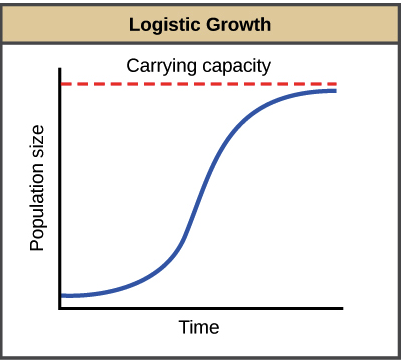  
  - $g(t) = \cfrac{C(t)}{1+x^{-k(t-m)}}$
    - $C(t)$ : capacity by time
    - $k$ : growth rate
- flat
  - no growth over time
  - constant value

### Seasonality
- Fourier Series
$$s(t)=\sum_{n=1}^N(a_n\cos(\frac{2\pi nt}{P})+b_n\sin(\frac{2\pi nt}{P}))$$

- can change fourier order of yearly, monthly, weekly_on/off_season, etc.

(with $a_0$ term)  

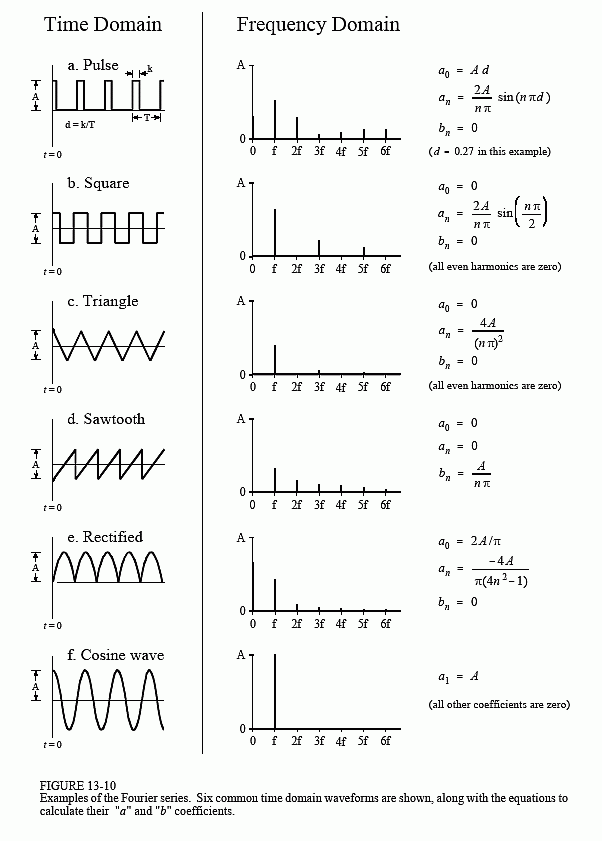


### Holiday
- built-in country_name='KR'
- can define own dates


## Data
- columns
  - ds (datestamp) : YYYY-MM-DD or YYYY-MM-DD HH:MM:SS (pandas)
  - y : numeric

In [ ]:
# ! + shell script : python에서 shell 실행
# 다른 방법: terminal에서 shell script만 실행

In [1]:
!pip install pystan==2.19.1.1

     |████████████████████████████████| 62.6 MB 173 kB/s  eta 0:00:01
     |████████████████████████████████| 1.9 MB 21.9 MB/s eta 0:00:01


In [2]:
!pip install fbprophet==0.7.0

     |████████████████████████████████| 64 kB 3.6 MB/s  eta 0:00:01
     |████████████████████████████████| 47 kB 13.6 MB/s eta 0:00:01
     |████████████████████████████████| 172 kB 33.5 MB/s eta 0:00:01
     |████████████████████████████████| 1.8 MB 20.4 MB/s eta 0:00:01
     |████████████████████████████████| 5.4 MB 34.5 MB/s eta 0:00:01    |▋                               | 102 kB 34.5 MB/s eta 0:00:01
  ERROR: Command errored out with exit status 1:
   command: /opt/conda/bin/python -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'/tmp/pip-install-ec26y8qu/fbprophet/setup.py'"'"'; __file__='"'"'/tmp/pip-install-ec26y8qu/fbprophet/setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d /tmp/pip-wheel-48g5wiht
       cwd: /tmp/pip-install-ec26y8qu/fbprophet/
  Complete output (44 lines):
  running bdist_wheel
  running build
  running build

In [5]:
!pip install plotly

     |████████████████████████████████| 27.7 MB 14.5 MB/s eta 0:00:01


In [4]:
from fbprophet import Prophet

Importing plotly failed. Interactive plots will not work.


---
# NeuralProphet
[Prophet vs NeuralProphet](https://towardsdatascience.com/prophet-vs-neuralprophet-fc717ab7a9d8)
> Here, NeuralProphet is better on smaller datasets, but Prophet is better with lots of training data.

###  Prophet + Auto-Regressive Neural network
- [BETA (github)](https://github.com/ourownstory/neural_prophet)

In [6]:
!pip install neuralprophet

     |████████████████████████████████| 67 kB 6.7 MB/s  eta 0:00:01
     |████████████████████████████████| 121 kB 33.2 MB/s eta 0:00:01
     |████████████████████████████████| 1.6 MB 34.4 MB/s eta 0:00:01
     |████████████████████████████████| 243 kB 29.3 MB/s eta 0:00:01


### READ DATA

In [75]:
import pandas  as pd

In [134]:
train_df = pd.read_csv("/USER/traffic/data/train.csv")
valid_df = pd.read_csv("/USER/traffic/data/validate.csv")
test_df = pd.read_csv("/USER/traffic/data/test.csv")

In [10]:
train_df

,날짜,시간,10,100,101,120,121,140,150,160,...,1020,1040,1100,1200,1510,2510,3000,4510,5510,6000
0,20200101,0,83247,19128,2611,5161,1588,892,32263,1636,...,1311,3482,11299,7072,1176,3810,748,3920,2133,3799
1,20200101,1,89309,19027,3337,5502,1650,1043,35609,1644,...,1162,3849,13180,8771,1283,3763,782,3483,2057,4010
2,20200101,2,66611,14710,2970,4631,1044,921,26821,1104,...,768,2299,7986,5426,1536,3229,491,2634,1526,3388
3,20200101,3,53290,13753,2270,4242,1021,790,21322,909,...,632,1716,5703,3156,1104,2882,431,2488,1268,3686
4,20200101,4,52095,17615,2406,3689,1840,922,22711,1354,...,875,2421,5816,2933,1206,2433,499,2952,1927,5608
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3274,20200517,19,311727,101285,10085,30637,10060,8749,148935,6801,...,6726,15431,25597,14292,9300,22238,3786,16936,10729,20194
3275,20200517,20,305354,91426,8607,26021,8095,7198,136503,6147,...,5501,15378,24661,14747,8239,20604,3203,15018,9767,17962
3276,20200517,21,306008,75113,6325,19933,5711,4494,129412,5134,...,4216,12558,22781,14081,6392,17937,2447,12403,7825,14031
3277,20200517,22,237447,49498,4209,12145,3891,2718,96698,3526,...,2578,8870,16640,11066,4427,11955,1495,7507,5387,8889


In [11]:
valid_df

,날짜,시간,10,100,101,120,121,140,150,160,...,1020,1040,1100,1200,1510,2510,3000,4510,5510,6000
0,20200511,0,77968,14429,1233,4021,981,881,28672,1064,...,637,2604,5239,4168,1155,3596,337,2262,1608,2337
1,20200511,1,48679,9136,823,2618,654,572,17722,672,...,353,1870,3359,2558,1002,2157,257,1425,1018,1810
2,20200511,2,33773,8199,578,2188,392,502,14464,579,...,345,1499,2646,2022,876,1959,232,1155,927,1530
3,20200511,3,41511,9986,726,2817,555,646,17793,650,...,390,1730,3398,1967,912,2462,281,1477,959,1882
4,20200511,4,78680,19509,1463,4720,825,1088,35125,997,...,679,2958,7369,4120,1569,4568,577,3155,1871,3656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,20200524,19,314226,98345,10625,28618,8316,6684,141675,6619,...,8254,16118,23304,14082,8447,21694,2180,15746,10903,21014
332,20200524,20,300001,87871,8226,22706,6981,5743,142933,6295,...,5225,15297,21919,14526,7332,19732,1990,14096,10028,17787
333,20200524,21,304150,71126,6002,18317,4939,3779,133110,4781,...,4072,12685,21135,14403,5443,16967,1359,11670,7963,14041
334,20200524,22,236751,44947,3575,11455,3135,2536,98582,3267,...,2489,8093,14427,10914,3861,11397,859,7270,5194,8230


In [12]:
test_df

,날짜,시간,10,100,101,120,121,140,150,160,...,1020,1040,1100,1200,1510,2510,3000,4510,5510,6000
0,20200518,0,82065,15172,1500,3294,1086,962,28931,1103,...,618,2790,5147,4331,1329,3665,404,2242,1619,2314
1,20200518,1,51248,9840,813,2356,696,546,17888,720,...,430,1864,3269,2561,921,2081,272,1390,1003,1766
2,20200518,2,39026,7894,760,2413,408,549,13357,498,...,322,1313,2765,1931,920,1764,228,1136,922,1309
3,20200518,3,40993,10137,780,2701,420,741,15544,532,...,326,1766,3320,2060,892,2447,337,1495,975,1912
4,20200518,4,77863,19603,1276,5019,968,1160,32101,968,...,669,2914,6986,3911,1368,4380,513,2940,1758,3629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,20200531,19,-999,-999,-999,-999,-999,-999,-999,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,-999
332,20200531,20,-999,-999,-999,-999,-999,-999,-999,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,-999
333,20200531,21,-999,-999,-999,-999,-999,-999,-999,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,-999
334,20200531,22,-999,-999,-999,-999,-999,-999,-999,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,-999


In [15]:
comp = pd.read_csv("/USER/traffic/data/fill_NAmean_ver2.csv")

In [17]:
comp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3312 entries, 0 to 3311
Data columns (total 38 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   datetime  3312 non-null   object
 1   날짜        3312 non-null   int64 
 2   시간        3312 non-null   int64 
 3   10        3312 non-null   int64 
 4   100       3312 non-null   int64 
 5   101       3312 non-null   int64 
 6   120       3312 non-null   int64 
 7   121       3312 non-null   int64 
 8   140       3312 non-null   int64 
 9   150       3312 non-null   int64 
 10  160       3312 non-null   int64 
 11  200       3312 non-null   int64 
 12  201       3312 non-null   int64 
 13  251       3312 non-null   int64 
 14  270       3312 non-null   int64 
 15  300       3312 non-null   int64 
 16  301       3312 non-null   int64 
 17  351       3312 non-null   int64 
 18  352       3312 non-null   int64 
 19  370       3312 non-null   int64 
 20  400       3312 non-null   int64 
 21  450       3312

In [36]:
new_df = pd.DataFrame({'ds': comp['datetime'], 
                       'y' : comp['10']
                      })
new_df

,ds,y
0,2020-01-01 00:00:00,83247
1,2020-01-01 01:00:00,89309
2,2020-01-01 02:00:00,66611
3,2020-01-01 03:00:00,53290
4,2020-01-01 04:00:00,52095
...,...,...
3307,2020-05-17 19:00:00,311727
3308,2020-05-17 20:00:00,305354
3309,2020-05-17 21:00:00,306008
3310,2020-05-17 22:00:00,237447


In [47]:
m = Prophet()
m.fit(new_df)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -142.412


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7226.59     0.0145546       199.044           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7238.39     0.0005394       123.706      0.4607           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7241.35    0.00239058       140.713           1           1      378   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     347       7243.04   0.000137378       75.1371   4.202e-07       0.001      475  LS failed, Hessian reset 
     399       7244.36      0.005335       119.891           1           1      546   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     428       7244.43   0.000116285       67.9487   1.487e-06       0.001      6

In [65]:
future = m.make_future_dataframe(periods=7*24, freq='h')
future

,ds
0,2020-01-01 00:00:00
1,2020-01-01 01:00:00
2,2020-01-01 02:00:00
3,2020-01-01 03:00:00
4,2020-01-01 04:00:00
...,...
3475,2020-05-24 19:00:00
3476,2020-05-24 20:00:00
3477,2020-05-24 21:00:00
3478,2020-05-24 22:00:00


In [66]:
forecast = m.predict(future)
forecast.tail(10)

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
3470,2020-05-24 14:00:00,250288.778302,296267.831804,396374.096289,247839.287723,252391.639764,98632.190047,98632.190047,98632.190047,113332.051074,113332.051074,113332.051074,-14699.861026,-14699.861026,-14699.861026,0.0,0.0,0.0,348920.968350
3471,2020-05-24 15:00:00,250307.312223,314864.081876,412045.272582,247816.942901,252515.552478,114412.340263,114412.340263,114412.340263,127011.637778,127011.637778,127011.637778,-12599.297515,-12599.297515,-12599.297515,0.0,0.0,0.0,364719.652486
3472,2020-05-24 16:00:00,250325.846143,324443.639839,423842.486064,247816.174644,252549.155679,123105.010644,123105.010644,123105.010644,133541.752413,133541.752413,133541.752413,-10436.741770,-10436.741770,-10436.741770,0.0,0.0,0.0,373430.856787
3473,2020-05-24 17:00:00,250344.380064,315422.963633,418462.006294,247817.894540,252582.485752,117445.471222,117445.471222,117445.471222,125682.366312,125682.366312,125682.366312,-8236.895090,-8236.895090,-8236.895090,0.0,0.0,0.0,367789.851285
3474,2020-05-24 18:00:00,250362.913984,296773.209349,396016.605114,247804.827068,252618.630467,94567.902038,94567.902038,94567.902038,100592.503438,100592.503438,100592.503438,-6024.601400,-6024.601400,-6024.601400,0.0,0.0,0.0,344930.816023
3475,2020-05-24 19:00:00,250381.447905,258052.158124,361870.861872,247792.506870,252683.342488,57986.358064,57986.358064,57986.358064,61810.921610,61810.921610,61810.921610,-3824.563545,-3824.563545,-3824.563545,0.0,0.0,0.0,308367.805969
3476,2020-05-24 20:00:00,250399.981825,216799.022867,314407.841577,247781.353445,252723.436475,15555.568326,15555.568326,15555.568326,17216.631059,17216.631059,17216.631059,-1661.062733,-1661.062733,-1661.062733,0.0,0.0,0.0,265955.550151
3477,2020-05-24 21:00:00,250418.515745,178314.890771,272424.836342,247776.268865,252778.282884,-25550.095614,-25550.095614,-25550.095614,-25992.411165,-25992.411165,-25992.411165,442.315551,442.315551,442.315551,0.0,0.0,0.0,224868.420131
3478,2020-05-24 22:00:00,250437.049666,135378.289670,237113.253669,247772.174372,252842.287975,-62989.291232,-62989.291232,-62989.291232,-65452.237105,-65452.237105,-65452.237105,2462.945874,2462.945874,2462.945874,0.0,0.0,0.0,187447.758434
3479,2020-05-24 23:00:00,250455.583586,100922.599908,202228.080630,247775.083095,252885.349433,-98930.793309,-98930.793309,-98930.793309,-103310.207646,-103310.207646,-103310.207646,4379.414337,4379.414337,4379.414337,0.0,0.0,0.0,151524.790278


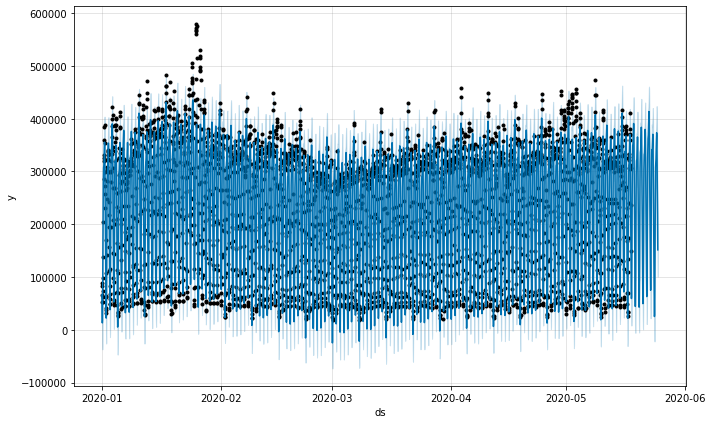

In [67]:
fig1 = m.plot(forecast)


/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


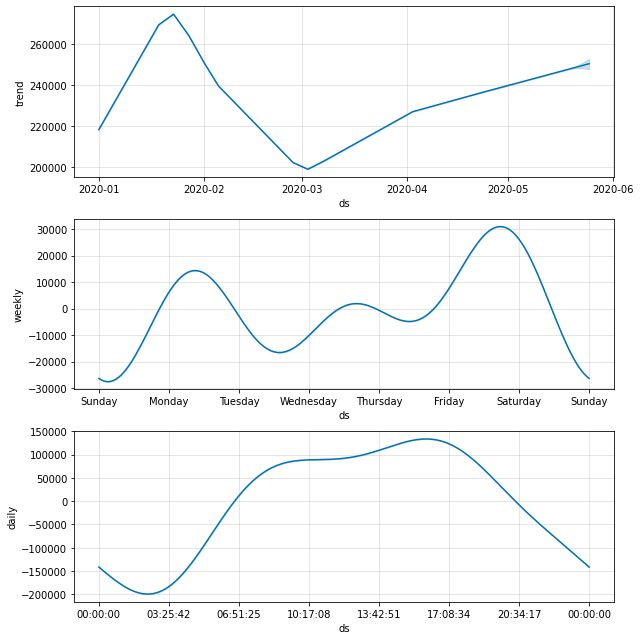

In [68]:
fig1 = m.plot(forecast)
fig2 = m.plot_components(forecast)

In [69]:
forecast['ds'], forecast['yhat']

(0      2020-01-01 00:00:00
 1      2020-01-01 01:00:00
 2      2020-01-01 02:00:00
 3      2020-01-01 03:00:00
 4      2020-01-01 04:00:00
                ...        
 3475   2020-05-24 19:00:00
 3476   2020-05-24 20:00:00
 3477   2020-05-24 21:00:00
 3478   2020-05-24 22:00:00
 3479   2020-05-24 23:00:00
 Name: ds, Length: 3480, dtype: datetime64[ns],
 0        66671.807557
 1        33185.848944
 2        13144.066420
 3        17753.082625
 4        51851.983262
             ...      
 3475    308367.805969
 3476    265955.550151
 3477    224868.420131
 3478    187447.758434
 3479    151524.790278
 Name: yhat, Length: 3480, dtype: float64)

In [155]:
comp = pd.read_csv("/USER/traffic/data/fill_NAmean_ver2.csv")

In [156]:
target = valid_df[valid_df['날짜'] >= 20200518]
target

,날짜,시간,10,100,101,120,121,140,150,160,...,1020,1040,1100,1200,1510,2510,3000,4510,5510,6000
168,20200518,0,82065,15172,1500,3294,1086,962,28931,1103,...,618,2790,5147,4331,1329,3665,404,2242,1619,2314
169,20200518,1,51248,9840,813,2356,696,546,17888,720,...,430,1864,3269,2561,921,2081,272,1390,1003,1766
170,20200518,2,39026,7894,760,2413,408,549,13357,498,...,322,1313,2765,1931,920,1764,228,1136,922,1309
171,20200518,3,40993,10137,780,2701,420,741,15544,532,...,326,1766,3320,2060,892,2447,337,1495,975,1912
172,20200518,4,77863,19603,1276,5019,968,1160,32101,968,...,669,2914,6986,3911,1368,4380,513,2940,1758,3629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,20200524,19,314226,98345,10625,28618,8316,6684,141675,6619,...,8254,16118,23304,14082,8447,21694,2180,15746,10903,21014
332,20200524,20,300001,87871,8226,22706,6981,5743,142933,6295,...,5225,15297,21919,14526,7332,19732,1990,14096,10028,17787
333,20200524,21,304150,71126,6002,18317,4939,3779,133110,4781,...,4072,12685,21135,14403,5443,16967,1359,11670,7963,14041
334,20200524,22,236751,44947,3575,11455,3135,2536,98582,3267,...,2489,8093,14427,10914,3861,11397,859,7270,5194,8230


In [79]:
# target['시간'] = pd.to_datetime(target['시간'], unit='h')

/tmp/ipykernel_24996/2021284501.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  target['시간'] = pd.to_datetime(target['시간'], unit='h')


In [85]:
target['시간'] = target['시간'].astype('timedelta64[h]')

/tmp/ipykernel_24996/1747692655.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  target['시간'] = target['시간'].astype('timedelta64[h]')


In [157]:
target.insert(loc=0, column='datetime', value='normal')

https://stackoverflow.com/questions/36416725/python-pandas-converting-date-and-hour-integers-to-datetime

In [158]:
target['datetime'] = pd.to_datetime(target['날짜'].astype('str')) + target['시간'].astype('timedelta64[h]')

/tmp/ipykernel_24996/3024511488.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  target['datetime'] = pd.to_datetime(target['날짜'].astype('str')) + target['시간'].astype('timedelta64[h]')


In [159]:
comp= comp.append(target)

/tmp/ipykernel_24996/1106674410.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  comp= comp.append(target)


In [190]:
print(comp)

                datetime        날짜  시간      10    100    101    120   121  \
0    2020-01-01 00:00:00  20200101   0   83247  19128   2611   5161  1588   
1    2020-01-01 01:00:00  20200101   1   89309  19027   3337   5502  1650   
2    2020-01-01 02:00:00  20200101   2   66611  14710   2970   4631  1044   
3    2020-01-01 03:00:00  20200101   3   53290  13753   2270   4242  1021   
4    2020-01-01 04:00:00  20200101   4   52095  17615   2406   3689  1840   
..                   ...       ...  ..     ...    ...    ...    ...   ...   
331  2020-05-24 19:00:00  20200524  19  314226  98345  10625  28618  8316   
332  2020-05-24 20:00:00  20200524  20  300001  87871   8226  22706  6981   
333  2020-05-24 21:00:00  20200524  21  304150  71126   6002  18317  4939   
334  2020-05-24 22:00:00  20200524  22  236751  44947   3575  11455  3135   
335  2020-05-24 23:00:00  20200524  23  143609  26137   2242   6166  1609   

      140     150  ...  1020   1040   1100   1200  1510   2510  3000   4510

In [189]:
col = target.columns
result = pd.DataFrame(columns =col[3:])
result


,10,100,101,120,121,140,150,160,200,201,...,1020,1040,1100,1200,1510,2510,3000,4510,5510,6000


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -302.628
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6131.54    0.00206973       447.357       0.363       0.363      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       6135.49   0.000297142       130.623   1.119e-06       0.001      190  LS failed, Hessian reset 
     159       6137.53   0.000262928       115.189   1.115e-06       0.001      286  LS failed, Hessian reset 
     199       6138.49   7.10271e-05       99.2816           1           1      339   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     270        6142.9   0.000749172       134.724   7.706e-06       0.001      457  LS failed, Hessian reset 
     299          6143   1.91948e-05       78.7562           1           1      490   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -153.247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7621.57    0.00742066       454.684      0.1692           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7635.88     0.0135235       79.9074       4.717      0.4717      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7643.06   0.000809895        79.049           1           1      378   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7644.58    0.00696868       103.593           1           1      500   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     411       7644.98   0.000104739       105.462   4.611e-07       0.001      566  LS failed, Hessian reset 
     499       7646.28    0.00228698    

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -162
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7548.51     0.0129376       660.359           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7555.35    0.00193763       337.682           1           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     245       7557.73   0.000785441       114.571   3.531e-06       0.001      335  LS failed, Hessian reset 
     270        7558.3   8.42987e-05       102.084   7.113e-07       0.001      412  LS failed, Hessian reset 
     299       7558.48    0.00155386        83.536           1           1      448   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       7558.67   0.000285387       236.633   1.602e-06       0.001      497  LS failed, Hessian reset 
 

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -46.1254
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       8272.68     0.0176487       582.343           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       8291.21    0.00458642       225.165           1           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     286       8295.66   0.000101639       172.783   3.983e-07       0.001      400  LS failed, Hessian reset 
     299       8296.57     0.0019646       212.305        1.03       0.103      415   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       8301.64    0.00353443       203.347      0.9473      0.9473      536   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     401       8301.71   8.68935e-05    

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -43.5524
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       8462.07     0.0238311       896.702      0.3117           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       8474.04    0.00543596       454.719           1           1      253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       8476.48    0.00166893       94.7812     0.05301       0.588      374   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     300       8476.54    0.00228909       659.981   2.415e-05       0.001      417  LS failed, Hessian reset 
     399       8478.22    0.00103813       244.349      0.7773      0.7773      550   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     445       8479.44   0.000127144    

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -141.45
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7216.62    0.00173436       82.6801      0.8315      0.8315      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7220.23    0.00574229        249.99           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       7220.35    0.00031987       217.171   3.608e-06       0.001      285  LS failed, Hessian reset 
     246       7220.77   0.000125024       82.4916   1.899e-06       0.001      380  LS failed, Hessian reset 
     299       7220.87   0.000282469       90.3296      0.5073      0.5073      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7221.13   2.69719e-07       79.7034      0.1695      0.1695      569   
    Iter      log prob

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -73.7956
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7718.52    0.00829363       487.843           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7730.05   0.000400236       70.4268           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     239       7731.61   0.000109333       143.267   6.546e-07       0.001      326  LS failed, Hessian reset 
     282       7732.32   0.000274079       134.604   2.681e-06       0.001      412  LS failed, Hessian reset 
     299       7732.44   0.000234741       63.8715           1           1      433   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7735.02     0.0124117       302.828           1           1      556   
    Iter      log pro

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -135.549
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7418.84    0.00655927       241.789           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7442.82    0.00879016       387.671      0.5295      0.5295      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     201       7443.09   0.000345687           234   2.018e-06       0.001      285  LS failed, Hessian reset 
     299       7451.75   0.000917195       67.6667           1           1      398   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     338        7455.3   0.000200265       191.292   5.138e-07       0.001      504  LS failed, Hessian reset 
     399       7458.64   0.000675028       55.0285           1           1      581   
    Iter      log pro

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -133.094
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7498.67    0.00160476       383.363      0.1979      0.1979      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7506.14   0.000129117       179.211      0.4829      0.4829      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       7506.74   0.000300012       188.318   3.408e-06       0.001      315  LS failed, Hessian reset 
     299       7507.42   0.000365502       72.3408           1           1      399   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7510.72   0.000267943       148.039      0.5906      0.5906      514   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     409       7511.02    9.6708e-05    

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -77.1164
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7043.01    0.00532673       145.717           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       7044.94   0.000284876       138.345   4.141e-06       0.001      224  LS failed, Hessian reset 
     199       7045.07      0.001779       109.859           1           1      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7046.25   0.000665059       78.6458           1           1      405   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     325       7046.47    0.00015827       129.127   1.967e-06       0.001      476  LS failed, Hessian reset 
     354       7046.53   3.18599e-07       56.0305      0.1959           1      520   
Optimization terminat

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -56.1089
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       8312.92    0.00238833       209.362           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        8334.4   0.000351057       594.332     0.01215     0.07956      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       8339.65     0.0120887       107.227           1           1      373   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       8347.73    0.00316937       285.428           1           1      495   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       8349.52     0.0108604       98.9477           1           1      619   
    Iter      log prob        ||dx||      ||grad||       alpha  

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/plot.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will b

Initial log joint probability = -117.153
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7756.92    0.00468785       348.541           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7775.46     0.0256989       558.677      0.5591      0.5591      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     294       7784.71   0.000259458       232.248     3.9e-07       0.001      405  LS failed, Hessian reset 
     299       7785.22    0.00265366       214.966           1           1      410   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     361       7787.76    0.00030343       226.816   3.807e-06       0.001      531  LS failed, Hessian reset 
     399       7787.97   1.34248e-06        60.757      0.3894           1      582   
    Iter      log pro

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -77.6457
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7450.14    0.00312563       317.368      0.1581           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7475.96     0.0666599       164.688           1           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7487.53    0.00259401       198.612       0.884       0.884      361   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306       7488.15   0.000634773       177.982   5.961e-06       0.001      408  LS failed, Hessian reset 
     399       7491.14   0.000157206       162.838      0.6962      0.6962      543   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     411       7493.66   0.000108127    

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -49.1437
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7633.44     0.0102102        273.18           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        7641.2    0.00268236       258.802           1           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7644.59   0.000803175       101.655           1           1      370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7650.54    0.00629706       115.781       2.095      0.2095      489   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     486       7651.33   7.23951e-05       99.1319    5.68e-07       0.001      651  LS failed, Hessian reset 
     499       7651.38   6.31091e-05    

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -93.0456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7168.75    0.00880846       214.046           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        7179.6    0.00031578       97.2098       0.828       0.828      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7184.28   0.000937709       67.3128           1           1      378   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314        7184.5   0.000722384       101.088   1.024e-05       0.001      430  LS failed, Hessian reset 
     389       7184.85    7.0957e-05       82.2597   8.299e-07       0.001      584  LS failed, Hessian reset 
     399       7184.87   2.57257e-05       32.9918           1           1      601   
    Iter      log pro

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -68.4334
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7494.28     0.0153694        507.93           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7509.37     0.0457885       817.104           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     287       7516.29   0.000147896       156.687   1.371e-06       0.001      396  LS failed, Hessian reset 
     299       7516.71   0.000313068       130.046      0.1549           1      411   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     313       7516.97    0.00010543       115.331   5.701e-07       0.001      474  LS failed, Hessian reset 
     389       7518.71   0.000693818       292.939   7.459e-06       0.001      610  LS failed, Hessian rese

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -168.876
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7091.36     0.0106018       436.515      0.9538      0.9538      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7110.03    0.00399101       105.211      0.3934           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     265        7112.9    0.00116928       278.686   6.373e-06       0.001      370  LS failed, Hessian reset 
     299       7113.93   0.000673757       94.9985      0.8118      0.8118      413   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7116.52    0.00284907       232.209      0.8402     0.08402      534   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       7118.61    0.00298735    

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -200.191
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6682.35     0.0157871       221.633      0.5293           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6687.94    0.00235526        88.885      0.3223      0.3223      253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       6688.67   0.000219812       93.2698    7.15e-07       0.001      317  LS failed, Hessian reset 
     299       6689.81    0.00115337       58.4699           1           1      428   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       6689.97   0.000161819       77.0346           1           1      555   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     485       6690.04   0.000100795    

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -138.262
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7320.86     0.0262009       887.712           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7327.48    0.00036735       179.124      0.6102      0.6102      259   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7329.83   1.63887e-05       71.2827     0.02959     0.02959      385   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     341       7330.03   0.000927893       137.656   1.017e-05       0.001      475  LS failed, Hessian reset 
     399       7330.19   0.000146146        78.136           1           1      551   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       7332.87   1.98921e-05    

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -93.0022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7819.91    0.00048562        388.51      0.4293      0.4293      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7846.83     0.0135808       670.938           1           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7850.39     0.0105007       673.607      0.3514      0.3514      379   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     326       7853.33   0.000542206       164.293   3.984e-06       0.001      452  LS failed, Hessian reset 
     399       7857.78    0.00023896       165.366      0.2074      0.7093      547   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     492       7859.76   0.000172438    

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -120.518
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7542.64    0.00297841       549.334           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7550.19   0.000298123       82.1056       0.473       0.473      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7552.21    0.00447885       424.074      0.7449      0.7449      368   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     343       7552.74   0.000111859       99.4142    1.52e-06       0.001      468  LS failed, Hessian reset 
     377       7552.76   4.04682e-07       69.5122           1           1      513   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -74.2332
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7400.69     0.0157887       215.294           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7415.15     0.0100602       165.494           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        7421.7     0.0721911        1201.8           1           1      359   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        7436.1    0.00140029       347.659       0.546       0.546      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       7441.81   3.04998e-05       62.0603       0.658       0.658      604   
    Iter      log prob        ||dx||      ||grad||       alpha  

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -73.3879
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6668.42    0.00055538       99.7243           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       6668.71     0.0003081       104.771   4.385e-06       0.001      200  LS failed, Hessian reset 
     199       6668.94     0.0203121       172.334      0.3271           1      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     223       6669.91   0.000899383         163.5   1.009e-05       0.001      359  LS failed, Hessian reset 
     299       6670.17   5.36606e-05        71.446           1           1      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     331       6670.17   1.71053e-07       61.2891      0.1044      0.3814      506   
Optimization terminat

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -61.0122
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7416.08    0.00288616       105.973      0.9641      0.9641      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        7423.2   0.000486186       150.293           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     252       7424.82   0.000135902       140.296    1.69e-06       0.001      363  LS failed, Hessian reset 
     299        7425.4    0.00127314       108.321      0.9228      0.9228      416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7428.89    0.00103259       135.973           1           1      537   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       7430.13    0.00295343    

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -50.8073
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       8295.78     0.0078846       623.538           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       8298.54   0.000147446       71.1259      0.1945      0.1945      257   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     297       8300.83   7.09352e-05        129.66   5.307e-07       0.001      429  LS failed, Hessian reset 
     299       8300.98    0.00335737       167.284          10           1      433   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       8301.98   0.000103358       81.0009       1.115      0.1115      563   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       8302.52    0.00190783    

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -261.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       6631.75   0.000155611        108.81    1.72e-06       0.001      158  LS failed, Hessian reset 
      99       6631.87   0.000410015       64.7955      0.2109           1      173   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6632.23   0.000506503       52.7543           1           1      302   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     291       6632.29    3.5378e-07       69.6398      0.2779      0.2779      436   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -115.109
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7000.43    0.00476337       437.456      0.7083      0.7083      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       7002.66   0.000494754       196.183    4.46e-06       0.001      193  LS failed, Hessian reset 
     165       7004.34   0.000234045       165.937   2.028e-06       0.001      295  LS failed, Hessian reset 
     199       7004.92   8.88205e-05       80.8892      0.4899      0.4899      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        7008.8    0.00129902       114.885           1           1      467   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     346       7009.33   0.000157128       98.6625   6.569e-07       0.001      571  LS failed, Hessian rese

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -224.433
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7183.63   0.000541263       98.7687      0.8584      0.8584      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       7184.95   0.000148618       144.685   1.137e-06       0.001      244  LS failed, Hessian reset 
     199       7185.27    0.00011394       65.6561           1           1      291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220        7185.3   9.51187e-05       81.0028   9.986e-07       0.001      358  LS failed, Hessian reset 
     299       7185.38   2.14061e-05       77.2732      0.3484      0.3484      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     332       7185.49   0.000400995       73.9366   5.449e-06       0.001      553  LS failed, Hessian rese

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -159.898
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6922.77    0.00244902       206.788           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6953.42     0.0165818       487.519           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       6965.38     0.0231881       519.722      0.5501      0.5501      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     348        6969.2   0.000328181       217.719   6.536e-07       0.001      441  LS failed, Hessian reset 
     399       6970.53   3.01822e-05       72.3477     0.03787           1      510   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     435       6970.72   0.000404532    

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -140.887
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7062.92   0.000156877       125.327           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       7063.25   0.000109965       111.681   1.354e-06       0.001      243  LS failed, Hessian reset 
     199       7063.33   2.72103e-07        51.545     0.03338      0.6536      290   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220       7063.34   1.19219e-05       71.9998   1.648e-07       0.001      371  LS failed, Hessian reset 
     229       7063.34   1.09017e-07       54.7511      0.2529      0.2529      384   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -59.1621
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6955.95     0.0214078       315.423           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6976.92    0.00507314       188.702      0.1604           1      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       6991.78     0.0198969        447.49           1           1      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     395       6999.67   0.000499843       63.5104   8.851e-06       0.001      537  LS failed, Hessian reset 
     399       6999.69   8.68796e-05       48.5244      0.9414      0.9414      543   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     402        6999.7   0.000248735    

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -155.493
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6845.92    0.00110262       102.094      0.5798      0.5798      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       6850.53   0.000248663       188.355   1.027e-06       0.001      235  LS failed, Hessian reset 
     194       6851.87   7.03152e-05       51.8373   8.193e-07       0.001      328  LS failed, Hessian reset 
     199       6851.97   0.000982181       72.8487           1           1      334   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     252       6855.62   0.000352166       235.559   2.291e-06       0.001      439  LS failed, Hessian reset 
     299        6857.2    0.00130044       75.7714           1           1      506   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -109.487
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6713.22    0.00534644       151.125      0.8401      0.8401      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6728.26     0.0178558       158.169      0.8258      0.8258      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     201       6728.36    0.00087365       239.263   6.538e-06       0.001      288  LS failed, Hessian reset 
     299       6731.38    0.00378072       129.506      0.2908           1      410   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     339        6732.3   0.000223068       167.401    1.65e-06       0.001      488  LS failed, Hessian reset 
     399       6732.76   0.000760001        71.508       2.045      0.2045      567   
    Iter      log pro

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -160.433
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99          7081     0.0005725       67.2427           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165       7084.68   0.000767189       164.583   6.417e-06       0.001      249  LS failed, Hessian reset 
     199        7085.2    0.00012596       57.4683      0.9212      0.9212      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     240       7085.77   0.000765541       135.283   1.149e-05       0.001      387  LS failed, Hessian reset 
     299       7086.07    3.4222e-05       48.9813           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     339       7086.68   0.000143803       133.538    1.31e-06       0.001      563  LS failed, Hessian rese

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling

Initial log joint probability = -228.461
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6657.15    0.00538672       188.505           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6658.09   5.35262e-05       76.9047   6.442e-07       0.001      275  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       6658.09   2.86761e-07       84.3249      0.5462      0.5462      308   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


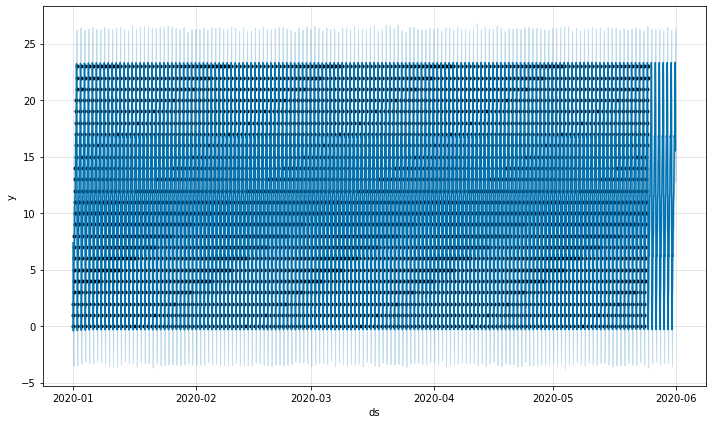

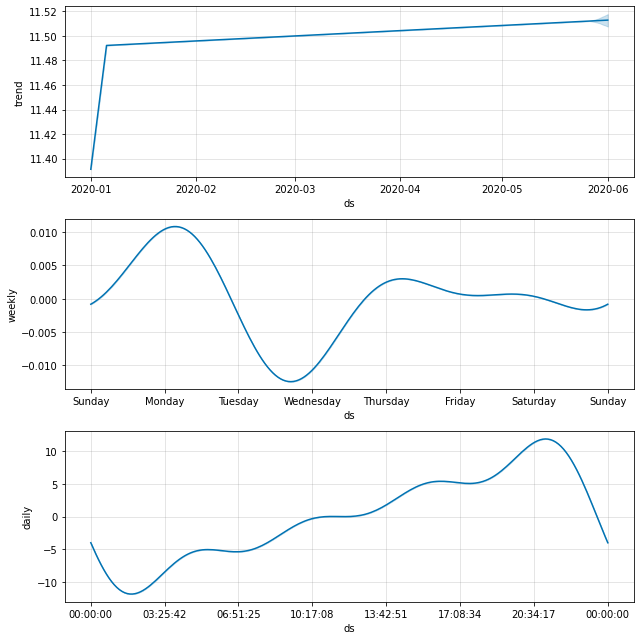

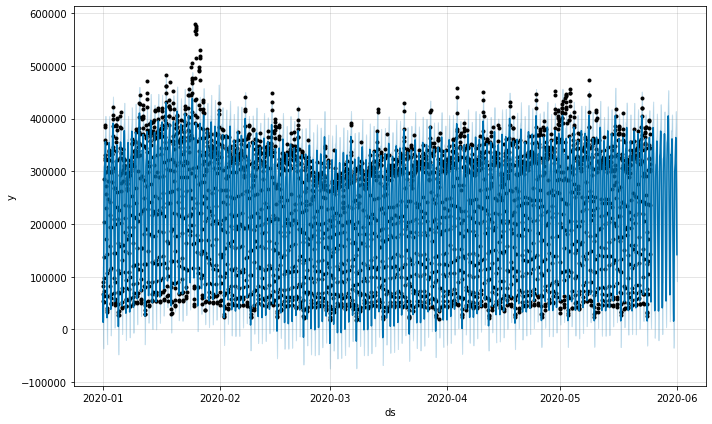

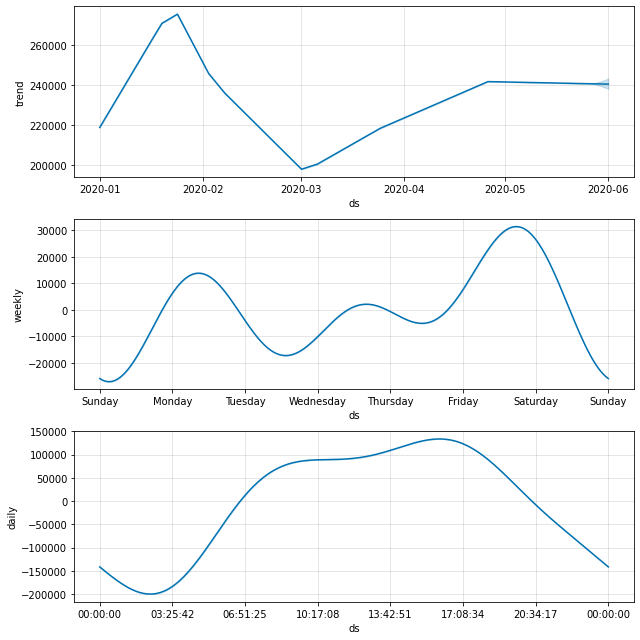

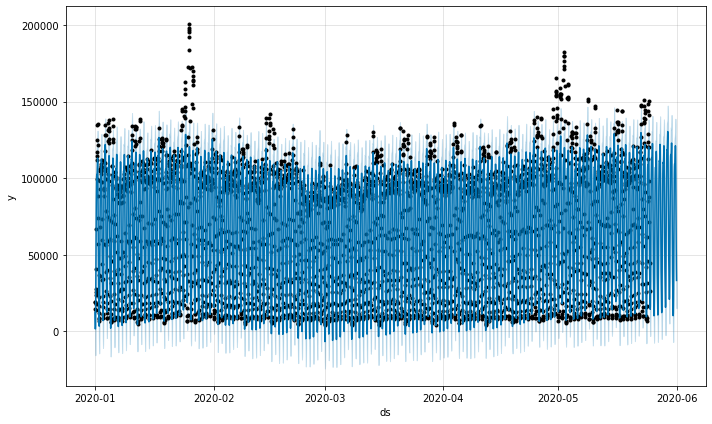

...

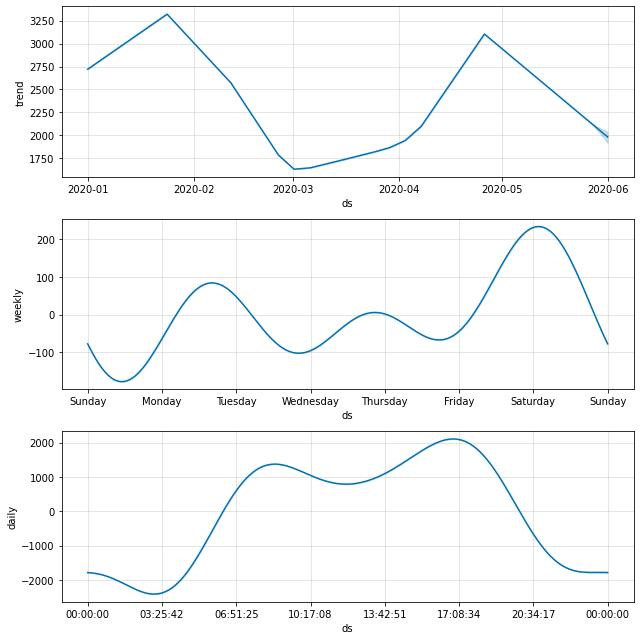

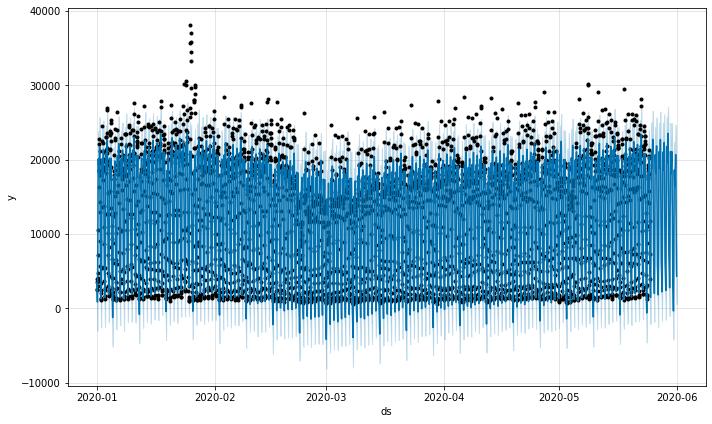

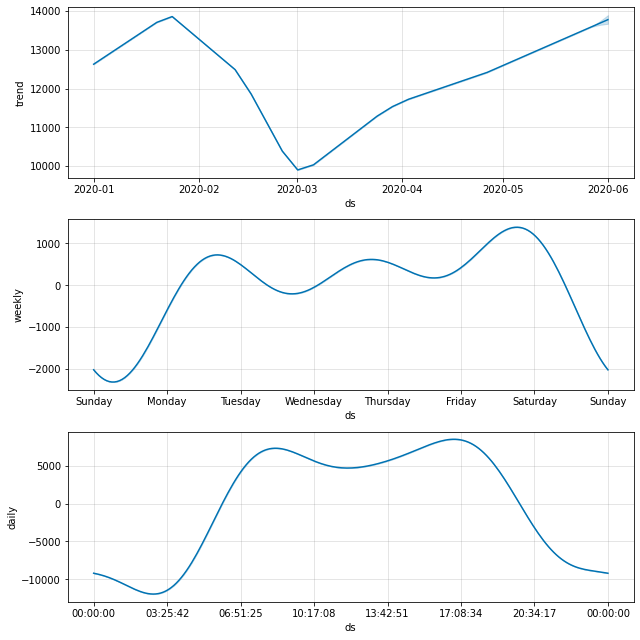

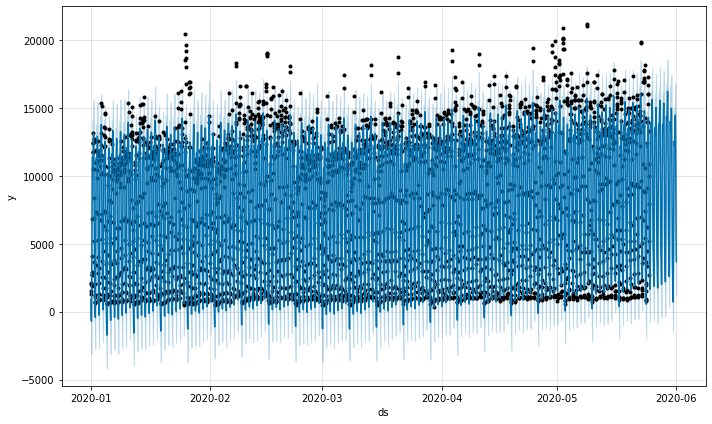

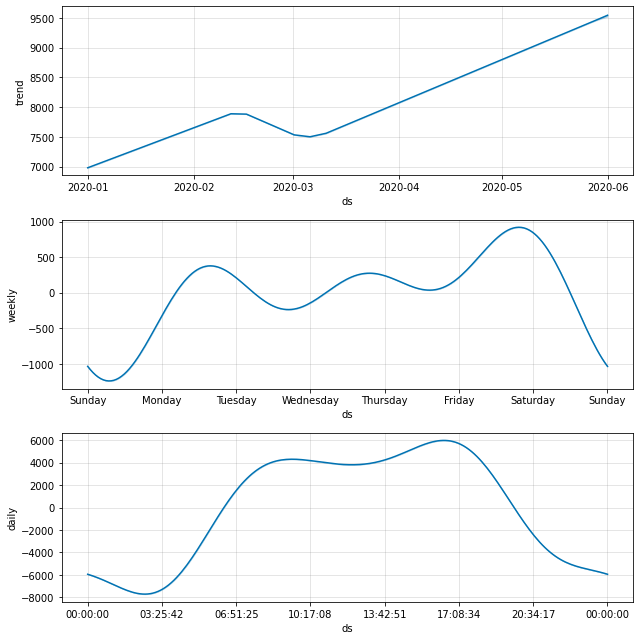

In [191]:
for road in col[2:-1]:
    new_df = pd.DataFrame({'ds': comp['datetime'], 
                           'y' : comp[road]})
    m = Prophet()
    m.fit(new_df)
    future = m.make_future_dataframe(periods=7*24, freq='h')
    # print(future)
    forecast = m.predict(future)
    result[road] = forecast['yhat'].iloc[-7*24:]
    fig1 = m.plot(forecast)
    fig2 = m.plot_components(forecast)

In [193]:
result

,10,100,101,120,121,140,150,160,200,201,...,1040,1100,1200,1510,2510,3000,4510,5510,6000,시간
3480,105404.061076,25476.147137,2121.030087,8073.350190,2091.892149,1832.735864,42462.428680,1734.938729,6355.741476,2295.332963,...,4495.796576,3302.774134,5068.199652,2606.643578,6898.832938,348.910129,3732.489851,3112.403396,NaN,7.522465
3481,72001.285114,18682.943582,1535.381534,6630.674975,1535.242506,1508.545643,28905.938431,1288.197729,5221.055181,1818.342629,...,3234.141375,-261.827422,2794.212919,2079.616143,5616.919163,228.986407,2976.507277,2435.720858,NaN,1.444728
3482,52061.177333,14488.141205,1128.627586,5919.100406,836.362597,1192.316841,22496.555554,957.576637,4471.854298,1768.437351,...,2305.280951,-2984.330526,1096.794850,1898.063144,4735.039092,-52.836475,1789.541565,1706.178539,NaN,-0.287138
3483,56921.515629,16423.326938,1178.141671,6237.978764,540.603619,1095.464313,26285.160592,959.815967,4459.103101,2100.054208,...,2508.769628,-2103.876879,1310.051083,2005.286583,4733.589909,-239.011909,1442.980365,1652.248655,NaN,1.712869
3484,91328.345774,26395.902369,1862.909376,7654.342508,1243.145453,1427.788284,40301.694071,1467.900916,5294.763373,2631.479598,...,4507.097783,4184.906642,4314.081287,2246.585275,6055.437873,7.525237,3394.328333,2910.456147,NaN,4.712776
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3643,298892.816066,89549.772968,8743.192227,24928.810130,9100.290974,6740.090067,129027.781679,6000.572770,19049.184504,7826.689736,...,14875.396245,26864.086525,17454.215754,7211.326930,21377.194369,2858.406441,16438.961396,10840.220462,NaN,18.331425
3644,256417.041065,69677.375994,6204.909121,19217.693611,6449.850327,4891.294852,108978.201693,4684.319161,14854.443972,6197.432533,...,12361.931456,19875.591668,14920.121561,5901.917137,16892.697851,1795.302758,12027.953704,7997.116201,NaN,21.331807
3645,215332.504344,52956.014896,4321.372935,14946.702802,4265.623026,3404.691720,90877.490162,3567.645120,11518.718504,4889.456680,...,9729.549639,12737.169528,11990.671245,4865.449140,13094.446537,834.518011,7862.868718,5631.216205,NaN,23.332176
3646,177895.418688,41343.344696,3182.605309,12091.114965,2971.484391,2497.562187,74249.960401,2776.967220,9311.122301,3858.972404,...,7565.065964,7420.103649,9399.785798,3996.921443,10377.024544,274.276955,5250.766511,4260.725524,NaN,21.600556


### 10 경부선

In [175]:
new_df = pd.DataFrame({'ds': comp['datetime'], 
                       'y' : comp['10']})
m = Prophet()
m.fit(new_df)
future = m.make_future_dataframe(periods=7*24, freq='h')
print(future)
forecast = m.predict(future)


result['10'] = forecast['yhat'].iloc[-7*24:]

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -153.247
                      ds
0    2020-01-01 00:00:00
1    2020-01-01 01:00:00
2    2020-01-01 02:00:00
3    2020-01-01 03:00:00
4    2020-01-01 04:00:00
...                  ...
3643 2020-05-31 19:00:00
3644 2020-05-31 20:00:00
3645 2020-05-31 21:00:00
3646 2020-05-31 22:00:00
3647 2020-05-31 23:00:00

[3648 rows x 1 columns]
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7621.57    0.00742066       454.684      0.1692           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7635.88     0.0135235       79.9074       4.717      0.4717      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7643.06   0.000809895        79.049           1           1      378   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


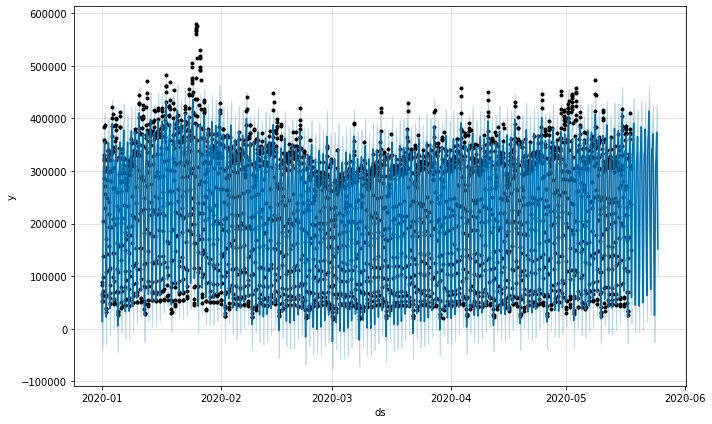

In [146]:
fig1 = m.plot(forecast)

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


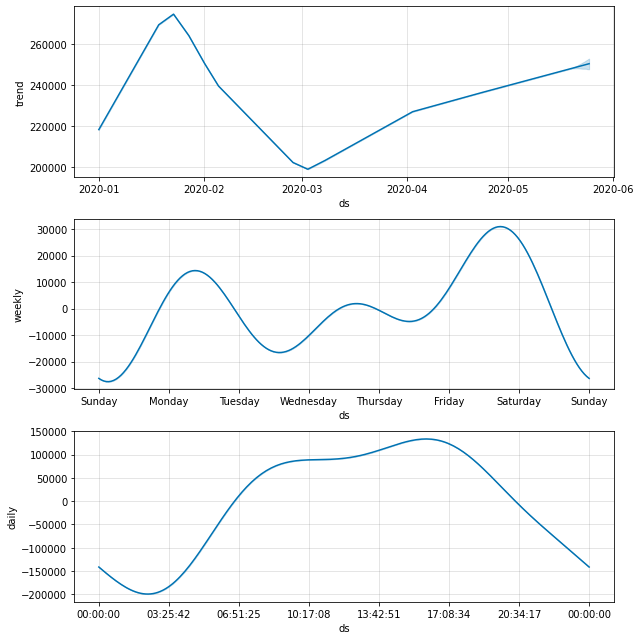

In [147]:
fig2 = m.plot_components(forecast)

In [176]:
result

,시간,10,100,101,120,121,140,150,160,200,...,1000,1020,1040,1100,1200,1510,2510,3000,4510,5510
3480,NaN,105404.061076,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3481,NaN,72001.285114,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3482,NaN,52061.177333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3483,NaN,56921.515629,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3484,NaN,91328.345774,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3643,NaN,298892.816066,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3644,NaN,256417.041065,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3645,NaN,215332.504344,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3646,NaN,177895.418688,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


100	남해선(순천-부산)

In [180]:
new_df = pd.DataFrame({'ds': comp['datetime'], 
                       'y' : comp['100']})
m = Prophet()
m.fit(new_df)
future = m.make_future_dataframe(periods=7*24, freq='h')
# print(future)
forecast = m.predict(future)
result['100'] = forecast['yhat'].iloc[-7*24:]

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -162
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7548.51     0.0129376       660.359           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7555.35    0.00193763       337.682           1           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     245       7557.73   0.000785441       114.571   3.531e-06       0.001      335  LS failed, Hessian reset 
     270        7558.3   8.42987e-05       102.084   7.113e-07       0.001      412  LS failed, Hessian reset 
     299       7558.48    0.00155386        83.536           1           1      448   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       7558.67   0.000285387       236.633   1.602e-06       0.001      497  LS failed, Hessian reset 
 

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


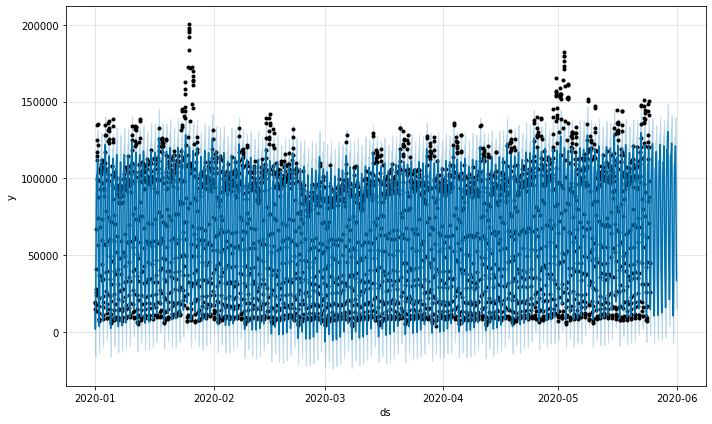

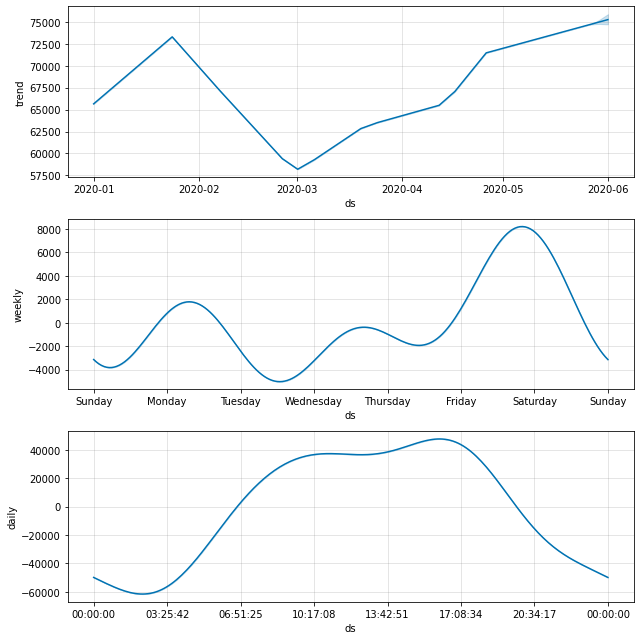

In [181]:
fig1 = m.plot(forecast)
fig2 = m.plot_components(forecast)

In [182]:
result

,시간,10,100,101,120,121,140,150,160,200,...,1000,1020,1040,1100,1200,1510,2510,3000,4510,5510
3480,NaN,105404.061076,25476.147137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3481,NaN,72001.285114,18682.943582,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3482,NaN,52061.177333,14488.141205,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3483,NaN,56921.515629,16423.326938,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3484,NaN,91328.345774,26395.902369,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3643,NaN,298892.816066,89549.772968,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3644,NaN,256417.041065,69677.375994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3645,NaN,215332.504344,52956.014896,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3646,NaN,177895.418688,41343.344696,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


101	남해선(영암-순천)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -46.1254
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       8272.68     0.0176487       582.343           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       8291.21    0.00458642       225.165           1           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     286       8295.66   0.000101639       172.783   3.983e-07       0.001      400  LS failed, Hessian reset 
     299       8296.57     0.0019646       212.305        1.03       0.103      415   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       8301.64    0.00353443       203.347      0.9473      0.9473      536   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     401       8301.71   8.68935e-05    

/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


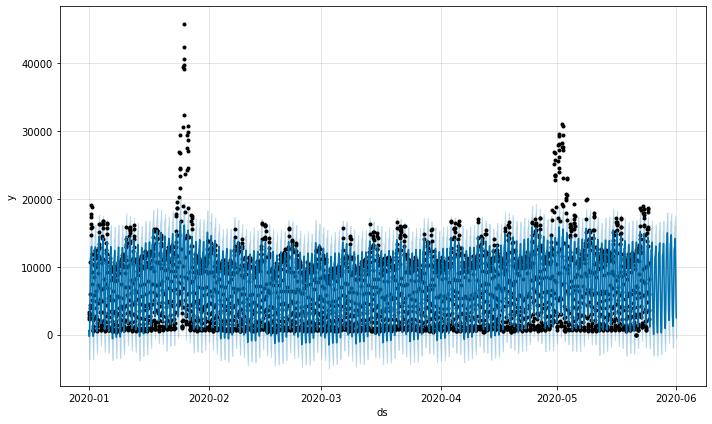

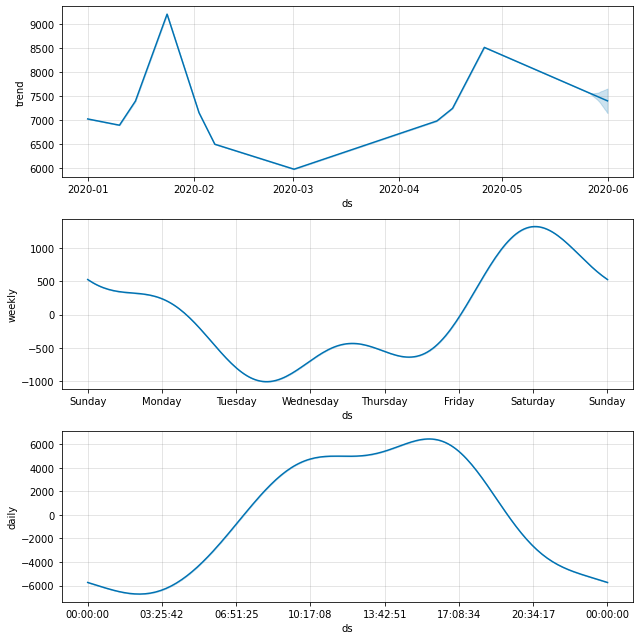

In [184]:
new_df = pd.DataFrame({'ds': comp['datetime'], 
                       'y' : comp['101']})
m = Prophet()
m.fit(new_df)
future = m.make_future_dataframe(periods=7*24, freq='h')
# print(future)
forecast = m.predict(future)
result['101'] = forecast['yhat'].iloc[-7*24:]
fig1 = m.plot(forecast)
fig2 = m.plot_components(forecast)

In [192]:
result

,10,100,101,120,121,140,150,160,200,201,...,1040,1100,1200,1510,2510,3000,4510,5510,6000,시간
3480,105404.061076,25476.147137,2121.030087,8073.350190,2091.892149,1832.735864,42462.428680,1734.938729,6355.741476,2295.332963,...,4495.796576,3302.774134,5068.199652,2606.643578,6898.832938,348.910129,3732.489851,3112.403396,NaN,7.522465
3481,72001.285114,18682.943582,1535.381534,6630.674975,1535.242506,1508.545643,28905.938431,1288.197729,5221.055181,1818.342629,...,3234.141375,-261.827422,2794.212919,2079.616143,5616.919163,228.986407,2976.507277,2435.720858,NaN,1.444728
3482,52061.177333,14488.141205,1128.627586,5919.100406,836.362597,1192.316841,22496.555554,957.576637,4471.854298,1768.437351,...,2305.280951,-2984.330526,1096.794850,1898.063144,4735.039092,-52.836475,1789.541565,1706.178539,NaN,-0.287138
3483,56921.515629,16423.326938,1178.141671,6237.978764,540.603619,1095.464313,26285.160592,959.815967,4459.103101,2100.054208,...,2508.769628,-2103.876879,1310.051083,2005.286583,4733.589909,-239.011909,1442.980365,1652.248655,NaN,1.712869
3484,91328.345774,26395.902369,1862.909376,7654.342508,1243.145453,1427.788284,40301.694071,1467.900916,5294.763373,2631.479598,...,4507.097783,4184.906642,4314.081287,2246.585275,6055.437873,7.525237,3394.328333,2910.456147,NaN,4.712776
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3643,298892.816066,89549.772968,8743.192227,24928.810130,9100.290974,6740.090067,129027.781679,6000.572770,19049.184504,7826.689736,...,14875.396245,26864.086525,17454.215754,7211.326930,21377.194369,2858.406441,16438.961396,10840.220462,NaN,18.331425
3644,256417.041065,69677.375994,6204.909121,19217.693611,6449.850327,4891.294852,108978.201693,4684.319161,14854.443972,6197.432533,...,12361.931456,19875.591668,14920.121561,5901.917137,16892.697851,1795.302758,12027.953704,7997.116201,NaN,21.331807
3645,215332.504344,52956.014896,4321.372935,14946.702802,4265.623026,3404.691720,90877.490162,3567.645120,11518.718504,4889.456680,...,9729.549639,12737.169528,11990.671245,4865.449140,13094.446537,834.518011,7862.868718,5631.216205,NaN,23.332176
3646,177895.418688,41343.344696,3182.605309,12091.114965,2971.484391,2497.562187,74249.960401,2776.967220,9311.122301,3858.972404,...,7565.065964,7420.103649,9399.785798,3996.921443,10377.024544,274.276955,5250.766511,4260.725524,NaN,21.600556


120	광주대구선

121	무안광주선

140	고창담양선

150	서해안선

160	울산선

200	대구포항선

201	익산장수선

251	호남선

270	순천완주선

300	청주영덕선

301	당진대전선

351	통영대전선

352	중부선

370	제2중부선

400	평택제천선

450	중부내륙선

500	영동선

550	중앙선

600	서울양양선

650	동해선(삼척-속초)

652	동해선(부산-포항)

1000	서울외곽순환선

1020	남해1지선

1040	남해2지선

1100	제2경인선

1200	경인선

1510	서천공주선

2510	호남지선

3000	대전남부선

4510	중부내륙지선

5510	중앙선지선

6000	부산외곽선